## Load Packages & Data

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from os import path
from collections import Counter
from tqdm import tqdm
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import warnings
warnings.filterwarnings("ignore")

import gensim
from gensim.parsing.preprocessing import remove_stopwords

import nltk
from nltk import tokenize
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline

import tensorflow as tf
from keras.models import Sequential
from keras import layers
from keras.layers import BatchNormalization, Dropout
from keras.backend import clear_session
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model, load_model

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/konradschulte/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/konradschulte/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [4]:
# Load dataset
# Please make sure that dataset file is in same folder as jupyter notebook file or type in correct file path
df_raw = pd.read_csv('complaints.csv')

## Exploratory Data Analysis & Preprocessing

In [ ]:
# First analysis of the dataset
print("There are {} observations and {} features in the dataset. \n".format(df_raw.shape[0],df_raw.shape[1]))

print("There are {} Products in this dataset such as: '{}'... \n".format(len(df_raw.Product.unique()), 
    "', '".join(df_raw.Product.unique()[0:5])))

print("There are {} Issues of complaints in this dataset such as: '{}'... \n".format(len(df_raw.Issue.unique()),
    "', '".join(df_raw.Issue.unique()[0:5])))                                                                                  

There are 2642708 observations and 18 features in the dataset. 

There are 18 Products in this dataset such as: 'Credit reporting, credit repair services, or other personal consumer reports', 'Debt collection', 'Checking or savings account', 'Credit card or prepaid card', 'Mortgage'... 

There are 165 Issues of complaints in this dataset such as: 'Problem with a credit reporting company's investigation into an existing problem', 'Improper use of your report', 'Attempts to collect debt not owed', 'Incorrect information on your report', 'Took or threatened to take negative or legal action'... 



In [ ]:
# Have look at the first observations: Narratives seem to be a lot of NaN ...
df_raw.head()

,Date received,Product,Sub-product,Issue,Sub-issue,Consumer complaint narrative,Company public response,Company,State,ZIP code,Tags,Consumer consent provided?,Submitted via,Date sent to company,Company response to consumer,Timely response?,Consumer disputed?,Complaint ID
0,2022-05-01,"Credit reporting, credit repair services, or o...",Credit reporting,Problem with a credit reporting company's inve...,Was not notified of investigation status or re...,NaN,NaN,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",PA,15146.0,NaN,NaN,Web,2022-05-01,In progress,Yes,NaN,5522962
1,2022-05-01,"Credit reporting, credit repair services, or o...",Credit reporting,Improper use of your report,Reporting company used your report improperly,NaN,NaN,"EQUIFAX, INC.",GA,30076.0,NaN,NaN,Web,2022-05-01,In progress,Yes,NaN,5522968
2,2022-05-01,"Credit reporting, credit repair services, or o...",Credit reporting,Improper use of your report,Reporting company used your report improperly,NaN,NaN,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",GA,30076.0,NaN,NaN,Web,2022-05-01,In progress,Yes,NaN,5522970
3,2022-05-01,"Credit reporting, credit repair services, or o...",Credit reporting,Improper use of your report,Reporting company used your report improperly,NaN,NaN,"TRANSUNION INTERMEDIATE HOLDINGS, INC.",PA,15234.0,NaN,NaN,Web,2022-05-01,In progress,Yes,NaN,5522974
4,2022-04-15,Debt collection,Other debt,Attempts to collect debt not owed,Debt is not yours,NaN,Company has responded to the consumer and the ...,TRUSTMARK CORPORATION,MS,39170.0,NaN,NaN,Referral,2022-04-18,Closed with explanation,Yes,NaN,5458963


In [ ]:
# Check how many narratives are NaNs
df_raw["Consumer complaint narrative"].isna().sum()

1718434

In [ ]:
# Since we can not use these observations we have to exclude them from our dataset:
df = df_raw[df_raw["Consumer complaint narrative"].notna()]

In [ ]:
# Let us now have a look at the dataset after removing (narrative) NaNs:
# We see that the data now contains 924.274 observations but only 820.861 unique narratives:
df.nunique()

Date received                     2591
Product                             18
Sub-product                         75
Issue                              160
Sub-issue                          216
Consumer complaint narrative    820861
Company public response             11
Company                           5297
State                               63
ZIP code                         44229
Tags                                 3
Consumer consent provided?           1
Submitted via                        1
Date sent to company              2591
Company response to consumer         6
Timely response?                     2
Consumer disputed?                   2
Complaint ID                    924274
dtype: int64

In [ ]:
# A closer look shows that there are also some duplicate narratives 
# while the other columns differ (different companies, days, states, see example):
df_raw[df_raw["Consumer complaint narrative"] == df_raw["Consumer complaint narrative"].value_counts().index[1]].nunique()

Date received                     84
Product                            2
Sub-product                        2
Issue                              3
Sub-issue                          6
Consumer complaint narrative       1
Company public response            2
Company                           12
State                             37
ZIP code                         352
Tags                               0
Consumer consent provided?         1
Submitted via                      1
Date sent to company              85
Company response to consumer       2
Timely response?                   2
Consumer disputed?                 0
Complaint ID                    1035
dtype: int64

In [ ]:
# Also, these narratives are sometimes classified differently, which could lead to worse performances of the models.
print("Overview of issue classification for following narrative (1035 times in dataset):")
print("")
print("'"+df_raw["Consumer complaint narrative"].value_counts().index[1]+"'")
print("")
print(df_raw[df_raw["Consumer complaint narrative"] == df_raw["Consumer complaint narrative"].value_counts().index[1]]["Issue"].value_counts())

Overview of issue classification for following narrative (1035 times in dataset):

'There are many mistakes appear in my report without my understanding.'

Incorrect information on your report    1021
Improper use of your report               12
Written notification about debt            2
Name: Issue, dtype: int64


In [ ]:
# Therefore, we decide to exclude the duplicates
df = df.drop_duplicates(subset=["Consumer complaint narrative"])
df.reset_index(drop=True, inplace=True)

In [ ]:
# Now we are left with 820.861 observations consisting of only unique narratives
df.nunique()

Date received                     2591
Product                             18
Sub-product                         75
Issue                              160
Sub-issue                          216
Consumer complaint narrative    820861
Company public response             11
Company                           5283
State                               63
ZIP code                         43916
Tags                                 3
Consumer consent provided?           1
Submitted via                        1
Date sent to company              2591
Company response to consumer         6
Timely response?                     2
Consumer disputed?                   2
Complaint ID                    820861
dtype: int64

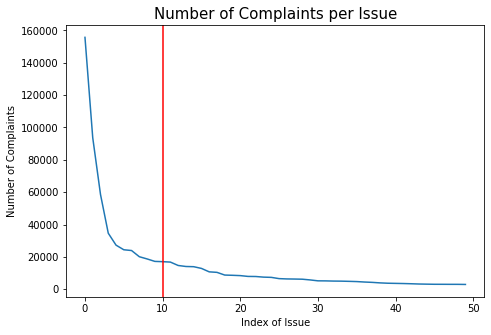

In [ ]:
# Let us now take a look at the other important column: "Issue"
# We notice that we have too many (160) issues for an accurate multiclass classification.
# We plot the number of complaints per issue and see that there are few issues which
# are dominant regarding complaint frequency (red line shows the cut we set later)

fig, ax = plt.subplots(figsize=(7.5, 5))
plt.plot([i for i in range(50)],df["Issue"].value_counts()[:50])
plt.title("Number of Complaints per Issue", fontsize=15)
plt.ylabel("Number of Complaints")
plt.xlabel("Index of Issue")
plt.axvline(x=10, color='r', linestyle='-')
plt.show()

In [ ]:
# We evaluate how many issues we want to exclude to have as much as possible observations left
# but also a managable amount of issues and end up with excluding 150 issues.
# Therefore, we filter our dataset for the remaining (top 10) issues:

len_before_filter = len(df)
top10 = df.Issue.value_counts()[:10]
df = df[df.Issue.isin(top10.index.tolist())]
df.reset_index(drop=True, inplace=True)

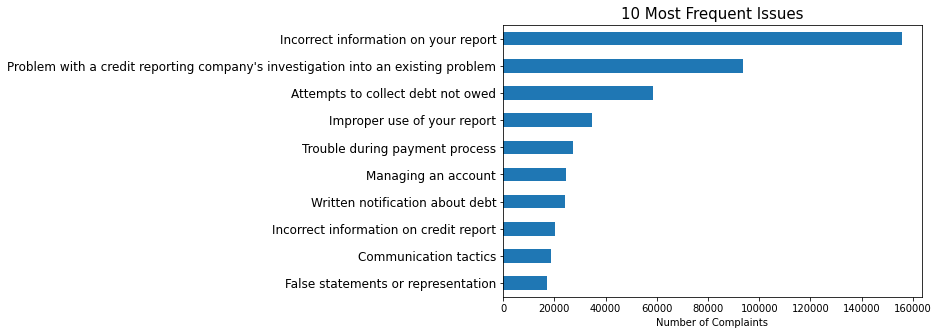


With these (Top) 10 Issues we retain 474366 of our 820861 observations (57.79% of our dataset).


In [ ]:
# The 10 (top frequent) issues left are shown in the following plot:

f, ax = plt.subplots(figsize=(7.5, 5))
plt.title("10 Most Frequent Issues", fontsize=15)
df['Issue'].value_counts()[:10].sort_values().plot.barh()
plt.yticks(fontsize=12)
plt.xlabel("Number of Complaints")
plt.show()
print("")
print("With these (Top) 10 Issues we retain " + str(len(df)) + " of our " + str(len_before_filter) + " observations (" + \
      str(round(sum(df["Issue"].value_counts().to_list()[:10])/len_before_filter*100,2)) + "% of our dataset).")

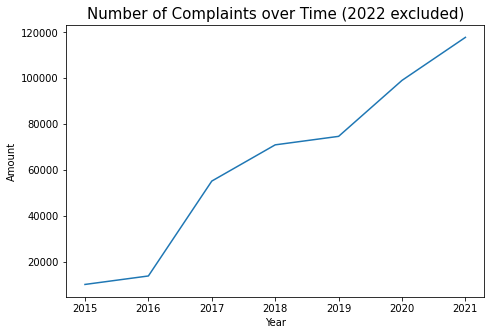

In [ ]:
# Now, we want to have a look at the other dimensions to get a better understanding of our dataset
# How are complaints distributed over time? Are there any trends? 
# We can see a straightforward upwards trend -> increasing importance of (analysing) complaints (correctly)
df["Year"] = [i[:4] for i in df["Date sent to company"]]
f, ax = plt.subplots(figsize=(7.5, 5))
plt.title("Number of Complaints over Time (2022 excluded)", fontsize=15)
df['Year'].value_counts().sort_index()[:-1].plot(ax=ax, kind='line', xlabel='Year', ylabel='Amount')
plt.show()

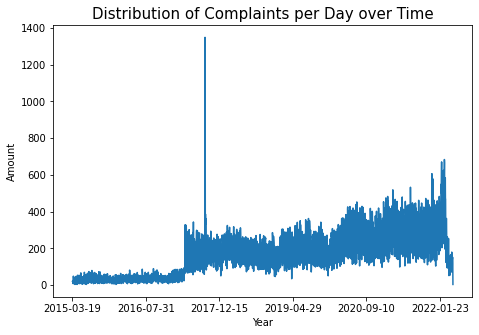

In [ ]:
# Let's have a more granular look at this and plot the distribution of complaints per day over time -> outlier
f, ax = plt.subplots(figsize=(7.5, 5))
plt.title("Distribution of Complaints per Day over Time", fontsize=15)
df['Date sent to company'].value_counts().sort_index().plot(ax=ax, kind='line', xlabel='Year', ylabel='Amount')
plt.show()

In [ ]:
# After detecting some outliers we find out that there were a lot of complaints around the 8th and 9th of September 2017
outlier = df['Date sent to company'].value_counts().sort_values(ascending=False)[:5]
outlier

2017-09-08    1349
2017-09-09    1013
2022-02-23     684
2022-02-04     671
2022-02-24     665
Name: Date sent to company, dtype: int64

In [ ]:
# Looking for further anomalies shows that the vast majority (2025/2364) of these complaints relate to only one company: Equifax
# Indeed, Equifax experienced a huge data breach in September 2017 which explains the outlier(s)
df[df["Date sent to company"].isin(outlier[:2].index.to_list())]["Company"].value_counts()[:5]

EQUIFAX, INC.                             2023
Experian Information Solutions Inc.         96
TRANSUNION INTERMEDIATE HOLDINGS, INC.      58
CAPITAL ONE FINANCIAL CORPORATION            7
WELLS FARGO & COMPANY                        6
Name: Company, dtype: int64

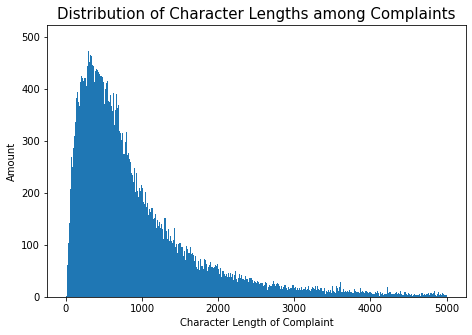

In [ ]:
# Let's have a look at the distribution of character lengths among the complaints
# Calculate length of complaints
df['narrative length']  = df["Consumer complaint narrative"].str.len()

# Plot shows: The very most complaints have a character length between 1 and 1000
filtered_df = df[df["narrative length"].isin([i for i in range(5000)])]
f, ax = plt.subplots(figsize=(7.5, 5))
x = filtered_df["narrative length"].value_counts().index.tolist()
y = filtered_df["narrative length"].value_counts()
plt.xlabel("Character Length of Complaint")
plt.ylabel("Amount")
plt.title("Distribution of Character Lengths among Complaints", fontsize=15)
plt.bar(x,y, width=2)
plt.show()

In [118]:
# Reduce dataframe to two columns of interest:
df = df[["Issue","Consumer complaint narrative"]]

In [ ]:
# Now we have to prepare our two columns of interest for the later models.
# We do this by saving the narratives as "X" after tokenizing and the removal of stopwords with the following function.
# This function also extracts the labels from the "Issue" column and saves it as corresponding "y".

def remove_stopwords(df, use_subset=False):
    if use_subset:
      df = df[:10000]
    y = df["Issue"].values
    
    X = []
    #Specifying that we want to drop the xx words
    list_to_drop = ["xx", "xxx", "xxxx", "xxxxx", "xxxxxx", "xxxxxxx", "xxxxxxxx", "xxxxxxxxx", "xxxxxxxxxx"] 
    stop_words = set(nltk.corpus.stopwords.words("english"))
    tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
    for par in tqdm(df["Consumer complaint narrative"].values):
        tmp = []
        sentences = nltk.sent_tokenize(par)
        for sent in sentences:
            sent = sent.lower()
            tokens = tokenizer.tokenize(sent)
            #filtering out words that are stop_words, that are longer than two letters and that are not in the specified list with x words
            filtered_words = [w.strip() for w in tokens if w not in stop_words and len(w) > 2 and w not in list_to_drop]
            tmp.extend(filtered_words)
        X.append(tmp)
    if (len(X) == len(y)):
      print("")
      print("Removal of stopwords successfull!")
    else:
      raise ValueError("Error occurred while removing stopwords as length of X and y differ")
    
    return X,y

In [ ]:
# Apply the function to our dataset:
X,y = remove_stopwords(df)

100%|██████████| 474366/474366 [03:19<00:00, 2374.53it/s]


Removal of stopwords successfull!


In [ ]:
# After removing stopwords we can now analyse which are the 10 most frequent words in all the complaints 

# To investigate this, we will create a list of all words ...
list_of_words = []
for i in tqdm(range(len(X))):
    for j in X[i]:
      list_of_words.append(j)

# ... and list all words as well as their frequency ...
keys = Counter(list_of_words).keys() 
values = Counter(list_of_words).values()
words = pd.DataFrame({"words":keys,"count":values})

# ... to then filter for the top 10:
words_sorted = words.sort_values(by="count",ascending=False)[:10]

100%|██████████| 474366/474366 [00:05<00:00, 86828.58it/s]


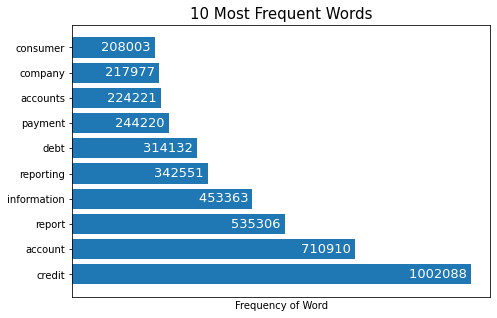

In [ ]:
# Now, we can plot the 10 most frequent words:
f, ax = plt.subplots(figsize=(7.5, 5))
x = words_sorted["words"]
y = words_sorted["count"]
plt.xlabel("Frequency of Word")
plt.title("10 Most Frequent Words", fontsize=15)
plt.barh(x,y)
plt.xticks([])
for index, value in enumerate(y):
    plt.text(value, index,str(value)+" ", fontsize=13, ha="right", va="center", color="white")
plt.show()

In [ ]:
# Another approach for gaining an overview of the word frequencies is by creating a wordcloud.

# First, we join all the words from the list of words:
text = " ".join(complaint for complaint in list_of_words)

In [ ]:
# Then we generate a word cloud image:
wordcloud = WordCloud(width=1920, height=1080, background_color="black").generate(text)

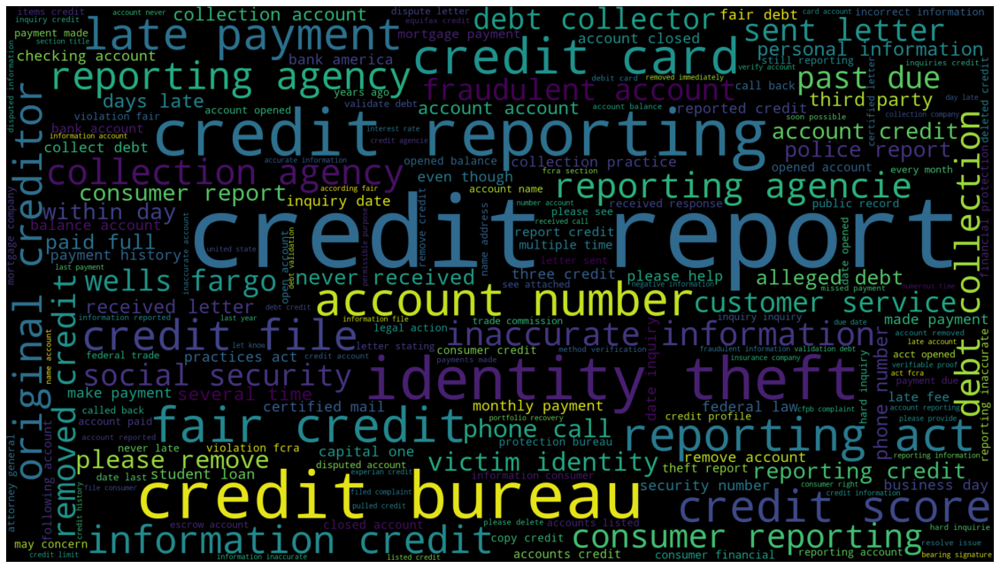

In [ ]:
# Displaying the word cloud gives us further insides because it also detects patterns 
# like the frequent occurrence of two following words (more precisely than just looking at the frequency of one specific word)
f, ax = plt.subplots(figsize=(20, 15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
# As last part of our exploratory analysis, we originally wanted to investigate the "level of anger" in different complaints.
# Therefore, we applied and evaluated five models: Text2Emotion, TextBlob, NRCLex, Vader, and HappyTransformer.
# Unfortunately, we were not satisfied with any results and therefore decided to exclude them from the code and report.

In [ ]:
# @Joni, you said you need this? Is neither used in EDA nor in preprocessing...


## Functions

In [ ]:
# Function for plotting the training history

def plot_training_history(history):
  '''
  Function plots training history for a model
  '''
  plt.figure(1, figsize = (20, 12))
  plt.subplot(1,2,1)
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.plot( history.history["loss"], label = "Training Loss")
  plt.plot( history.history["val_loss"], label = "Validation Loss")
  plt.grid(True)
  plt.legend()

  plt.subplot(1,2,2)
  plt.xlabel("Epochs")
  plt.ylabel("Accuracy")
  plt.plot( history.history["accuracy"], label = "Training Accuracy")
  plt.plot( history.history["val_accuracy"], label = "Validation Accuracy")
  plt.grid(True)
  plt.legend()

In [ ]:
# this function can be used to plot the value_counts of a column 
# additionally a line 
def plot_value_counts(df=df,column="Issue",top = 10, print_line = None):
  max_top = len(df[column].value_counts())
  assert top <= max_top, "Only {} unique values within '{}' --> top must be smaller or equal to {}".format(max_top,column,max_top)
  fig, ax = plt.subplots(figsize=(15, 10))
  plot_value_count = plt.plot([i for i in range(top)],df[column].value_counts()[:top])
  plot_value_count = plt.title("Number of complaints per {}".format(column))
  plot_value_count = plt.ylabel("Number of complaints")
  plot_value_count = plt.xlabel("Index of {}".format(column))
  if print_line != None:
    plot_value_count = plt.axvline(x=print_line, color='r', linestyle='-')
  return plot_value_count

In [ ]:
# this function can be used to convert a list of lists (including words) to a list of sentences
def convert_to_sentence(list_of_lists):
  """
  Takes list of lists of words as input and outputs list of sentences
  """
  sentences = []
  for i in tqdm(range(len(list_of_lists))):
    sentence = ""
    for j in list_of_lists[i]:
      sentence += j + " "
    sentence = sentence[:-1]
    sentences.append(sentence)
  return sentences

In [ ]:
# Function for calculating accuracy for a specific model
def get_acc(df):
  mean_accuracy = df.groupby('name_of_model').accuracy.mean()

  acc_df = pd.concat([mean_accuracy], axis= 1, 
            ignore_index=True)
  acc_df.columns = ['Mean Accuracy']
  return acc_df

In [ ]:
# define functions for the preprocessing of unsupervised models
# LDA preprocessing includes lematizing and tokenizing

def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
      if len(token) > 3:                          # removal of stopwords not necessary as this has already be done 
        result.append(lemmatize_stemming(token))
    return result

## Models

### Topic Classification (Supervised): LinearSVC, Random Forest, Multinomial Naive Bayes & Logistic Regression

In [ ]:
df_supmodels = df

In [ ]:
#Copying the two columns that we need for our analysis
df_supmodels = df_supmodels[['Issue', 'Consumer complaint narrative']].copy()
#Giving the categories numbers from 1 to 10
df_supmodels['category_id'] = df_supmodels['Issue'].factorize()[0]
#Selecting relevant columns
df_supmodels = df_supmodels[["Issue", "Consumer complaint narrative", "category_id"]]
#Retrieving a unique list of issues
category_id_df = df_supmodels[['Issue', 'category_id']].drop_duplicates()

#Creating dictionaries that can help convert the Issue name into the id of the category and back
category_to_id = dict(zip(category_id_df["Issue"], category_id_df["category_id"]))
id_to_category = dict(zip(category_id_df["category_id"], category_id_df["Issue"]))
df_supmodels_reduced = df_supmodels[:10000]

In [ ]:
X,y = remove_stopwords(df_supmodels_reduced, True)

In [ ]:
# Encoding y
encoder = LabelEncoder()
y = encoder.fit_transform(y)
np.unique(y)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
#Converting the list of lists back into a sentence and then to a dataframe column
cleaned_sents = convert_to_sentence(X)
df_supmodels_reduced["Consumer complaint narrative"] = cleaned_sents

In [ ]:
#Turning each complaint into a vector with the countvectorizer method
count_vec = CountVectorizer()

count_features = count_vec.fit_transform(df_supmodels_reduced["Consumer complaint narrative"])
count_labels = df_supmodels_reduced.category_id

#Turning each complaint into a vector with the tfidfvectorizer method
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=2,
                        ngram_range=(1, 2))

tfidf_features = tfidf.fit_transform(df_supmodels_reduced["Consumer complaint narrative"])

tfidf_labels = df_supmodels_reduced.category_id

In [ ]:
#Train test split
X = df_supmodels_reduced['Consumer complaint narrative'] # Consumer complaints saved in X
y = df_supmodels_reduced['Issue'] # Labels that we want to predict, the 10 different issues

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20,
                                                    random_state = 42)

In [ ]:
%%time
#NAIVEBAYES
#LOGISTICREGRESSION
#SUPPORT VECTOR MACHINE
#RANDOMFOREST
models = [
  RandomForestClassifier(random_state=42),
  LinearSVC(),
  MultinomialNB(),
  LogisticRegression(random_state=42),
  ]

# 5-fold Cross validation
Cross_val = 5
cv_df_count = pd.DataFrame(index=range(Cross_val * len(models)))
cv_df_tfidf = pd.DataFrame(index=range(Cross_val * len(models)))

entries_count = []
entries_tfidf = []
for model in models:
  name_of_model = model.__class__.__name__
  accuracies_count = cross_val_score(model, count_features, count_labels, scoring='accuracy', cv=Cross_val)
  accuracies_tfidf = cross_val_score(model,tfidf_features, tfidf_labels,scoring='accuracy', cv=Cross_val)
  for fold_idx, accuracy in enumerate(accuracies_count):
    entries_count.append((name_of_model, fold_idx, accuracy))
  for fold_idx, accuracy in enumerate(accuracies_tfidf):
    entries_tfidf.append((name_of_model, fold_idx, accuracy))
    
cv_df_count = pd.DataFrame(entries_count, columns=['name_of_model', 'fold_idx', 'accuracy'])
cv_df_tfidf = pd.DataFrame(entries_tfidf, columns=['name_of_model', 'fold_idx', 'accuracy'])

CPU times: user 9min 19s, sys: 2min 31s, total: 11min 51s
Wall time: 9min 12s


We can see that the runtime for 10.000 rows is 8.5 minutes. If we ran it for the entire dataset, it would result in a runtime of 6.5 hours. Due to this, we decided to run the cross validation, only on the 10.000 rows, and then decide which models to use in the final analysis

In [ ]:
acc_count = get_acc(cv_df_count)
acc_tfidf = get_acc(cv_df_tfidf)

In [ ]:
print('\t\tCount Vectorizer\n')
print(acc_count)
print('\n\n\t\tTF-IDF Vectorizer\n')
print(acc_tfidf)

		Count Vectorizer

                        Mean Accuracy
name_of_model                        
LinearSVC                      0.6108
LogisticRegression             0.6353
MultinomialNB                  0.6047
RandomForestClassifier         0.6473


		TF-IDF Vectorizer

                        Mean Accuracy
name_of_model                        
LinearSVC                      0.6818
LogisticRegression             0.6549
MultinomialNB                  0.4970
RandomForestClassifier         0.6421


We can see that the LinearSVC with the TF-IDF vectorizer performs the best out of the 4 models. Therefore, we are continuing our analysis with the LinearSVC model.

In [ ]:
#Doing train, test split again with our features and labels from the tfidf tokenizer
X_train, X_test, y_train, y_test = train_test_split(tfidf_features, 
                                                              tfidf_labels, 
                                                              test_size=0.20, 
                                                              random_state=42)
#Specifying the best model
SVCpipe = Pipeline([('SVC',LinearSVC(verbose=10))])

In [ ]:
%%time
#Performing grid search for the C value of LinearSVC to find the optimal score
param_grid = {'SVC__C':[0.01,0.1,1, 10]}
linearSVC = GridSearchCV(SVCpipe,param_grid,cv=5,return_train_score=True)
linearSVC.fit(X_train,y_train)
y_pred = linearSVC.predict(X_test)
print()
print("The optimal value of C out of the searched parameters is: ",linearSVC.best_params_)
print("The accuracy for the chosen hyperparameter is: ", linearSVC.best_score_)

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]
The optimal value of C out of the searched parameters is:  {'SVC__C': 1}
The accuracy for the chosen hyperparameter is:  0.682625
CPU times: user 46.8 s, sys: 188 ms, total: 47 s
Wall time: 47.8 s


Because of how long the gridsearch for the optimal parameters are taking, this is also only run on the 10.000 rows. In the end we find that the optimal value of C is 1, which provides us with an accuracy of 0.68%

We now run the linearSVC with the found value of C on the entire dataset

In [ ]:
%%time
X,y = remove_stopwords(df_supmodels, False)

# Encoding y
encoder = LabelEncoder()
y = encoder.fit_transform(y)
np.unique(y)

#Converting the list of lists back into a sentence and then to a dataframe column
cleaned_sents = convert_to_sentence(X)
df_supmodels["Consumer complaint narrative"] = cleaned_sents

tfidf = TfidfVectorizer(sublinear_tf=True, min_df=2,
                        ngram_range=(1, 2))

tfidf_features = tfidf.fit_transform(df_supmodels["Consumer complaint narrative"])

tfidf_labels = df_supmodels.category_id

X_train, X_test, y_train, y_test = train_test_split(tfidf_features, tfidf_labels, 
                                                    test_size=0.20,
                                                    random_state = 42)

linearSVC = LinearSVC(C=1)


linearSVC.fit(X_train,y_train)
y_pred = linearSVC.predict(X_test)

CPU times: user 9min 6s, sys: 11.6 s, total: 9min 18s
Wall time: 9min 20s


In [ ]:
# Classification report
print('\t\tCLASSIFICATIION METRICS REPORT\n')
print(metrics.classification_report(y_test, y_pred, 
                                    target_names= df['Issue'].unique()))

		CLASSIFICATIION METRICS REPORT

                                                                                  precision    recall  f1-score   support

                                                             Managing an account       0.92      0.97      0.94      4921
                                            Incorrect information on your report       0.76      0.84      0.80     31096
                                               Attempts to collect debt not owed       0.64      0.68      0.66     11784
Problem with a credit reporting company's investigation into an existing problem       0.77      0.75      0.76     18541
                                                 Written notification about debt       0.65      0.53      0.58      4819
                                                     Improper use of your report       0.80      0.81      0.80      6878
                                                  Trouble during payment process       0.89      0.94      0.91

Text(0.5, 1.0, 'CONFUSION MATRIX - LinearSVC\n')

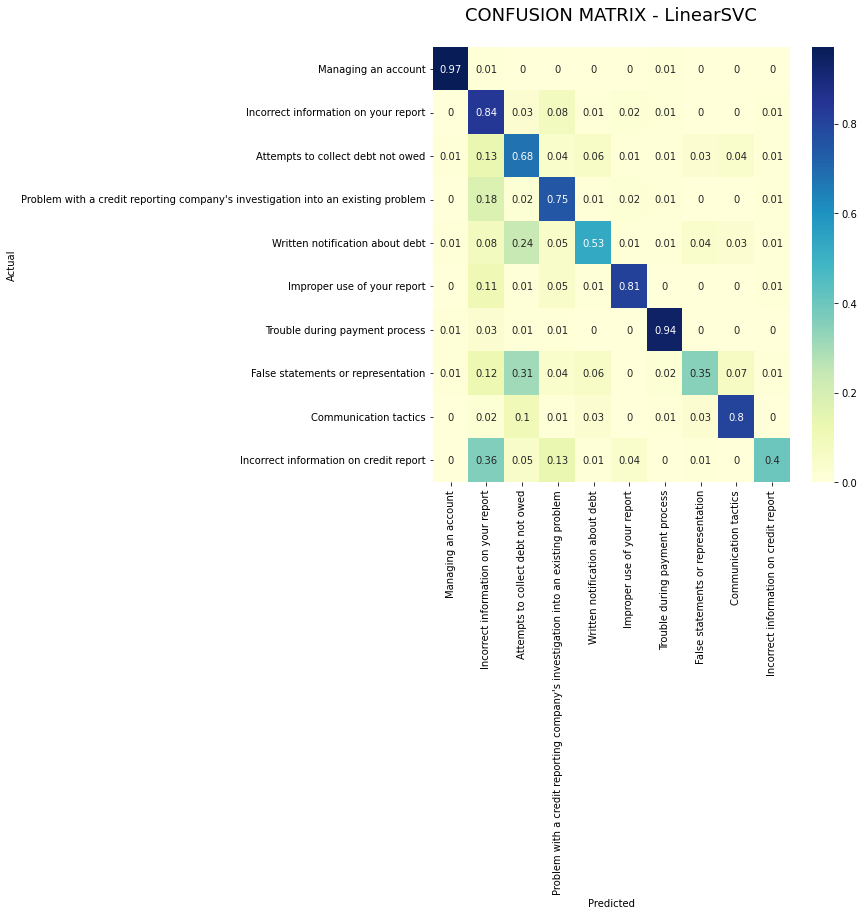

In [ ]:
#Creating the confusion matrix
confus_matrix = confusion_matrix(y_test, y_pred)
confus_matrix = np.round(confus_matrix / confus_matrix.sum(axis=1, keepdims=True),2)
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(confus_matrix, annot=True, cmap="YlGnBu", 
            xticklabels=category_id_df["Issue"].values, 
            yticklabels=category_id_df["Issue"].values)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title("CONFUSION MATRIX - LinearSVC\n", size=18)

### Topic Classification (Supervised): Convolutional Neural Network 1 & 2

#### Train-, Val.-, Test-Split & Tokenization

In [ ]:
# Splitting the narratives
# Train-Test-Split: Train = 80%, Test = 20%
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42)

In [ ]:
# Splitting the narratives
# Train-Validation-Split: Train = 70%, Validation = 10%
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.125, random_state=1) # 0.125 x 0.8 = 0.1

In [ ]:
# Initialize Tokenizer
tokenizer = Tokenizer(num_words=100000)    # Will use 100,000 most important words 
tokenizer.fit_on_texts(X)                  # Tokenizer fitted with X

In [ ]:
# Tokenizing train, test and validation sets

X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)
X_valid = tokenizer.texts_to_sequences(X_valid)

vocab_size = len(tokenizer.word_index) + 1  # Adding 1 because of reserved 0 index

#### Model 1: CNN with Embedding

In [ ]:
# Preparing input for embedding layer
# Pading the sequence of words with zeros due to different length of narratives

maxlen = 200 # Cutting narratives after 200 words

X_train = pad_sequences(X_train, padding='post', maxlen=maxlen)
X_test = pad_sequences(X_test, padding='post', maxlen=maxlen)
X_valid = pad_sequences(X_valid, padding='post', maxlen=maxlen)

print(X_train[0, :])

[  259    13    14    65  1116    98   312     1    89     1     3    97
    41    12    14 18373    65    12    14   259   267  3292   228   473
   349    51   233   259    65   198   327 17571   169    14 49535   129
   312     1    89    99    72     1     5    59     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0   

In [ ]:
# CNN with embedding layer

embedding_dim = 50

model = Sequential()
model.add(layers.Embedding(input_dim=vocab_size, 
                           output_dim=embedding_dim, 
                           input_length=maxlen))
model.add(layers.Conv1D(128, 3, activation='relu'))
model.add(layers.GlobalMaxPool1D())
model.add(layers.Flatten())
model.add(layers.Dense(10, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))       # 10 nodes since we have 10 classes, Softmax activation function for multi-class model

In [ ]:
# Compiling and printing model

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  # Important to use appropriate loss function for multi-class model
              metrics=['accuracy'])
model.summary()
# Param for embedding layer equals vocab size (see above) x embedding dim (here 50)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 200, 50)           4964750   
                                                                 
 conv1d (Conv1D)             (None, 198, 128)          19328     
                                                                 
 global_max_pooling1d (Globa  (None, 128)              0         
 lMaxPooling1D)                                                  
                                                                 
 flatten (Flatten)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 10)                1290      
                                                                 
 dense_1 (Dense)             (None, 10)                110       
                                                        

In [ ]:
# Clearing the Keras session to avoid starting off with the computed weights from the previous training
clear_session()

In [ ]:
# Fitting the model

%%time
tf.random.set_seed(42)
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_valid, y_valid), batch_size=10)

Epoch 1/10
33213/33213 [==============================] - 2014s 61ms/step - loss: 1.1081 - accuracy: 0.6005 - val_loss: 1.0159 - val_accuracy: 0.6319
Epoch 2/10
33213/33213 [==============================] - 2210s 67ms/step - loss: 0.9360 - accuracy: 0.6623 - val_loss: 0.9797 - val_accuracy: 0.6477
Epoch 3/10
33213/33213 [==============================] - 2201s 66ms/step - loss: 0.8479 - accuracy: 0.6984 - val_loss: 0.9877 - val_accuracy: 0.6519
Epoch 4/10
33213/33213 [==============================] - 2169s 65ms/step - loss: 0.7698 - accuracy: 0.7286 - val_loss: 0.9742 - val_accuracy: 0.6636
Epoch 5/10
33213/33213 [==============================] - 2134s 64ms/step - loss: 0.6983 - accuracy: 0.7567 - val_loss: 0.9951 - val_accuracy: 0.6619
Epoch 6/10
33213/33213 [==============================] - 2134s 64ms/step - loss: 0.6384 - accuracy: 0.7806 - val_loss: 1.0402 - val_accuracy: 0.6646
Epoch 7/10
33213/33213 [==============================] - 2137s 64ms/step - loss: 0.5843 - accuracy:

In [ ]:
print(model.evaluate(X_valid, y_valid))
print(model.evaluate(X_test, y_test))

1483/1483 [==============================] - 4s 3ms/step - loss: 1.1576 - accuracy: 0.6586
[1.1576366424560547, 0.6586085557937622]
2966/2966 [==============================] - 8s 3ms/step - loss: 1.1576 - accuracy: 0.6601
[1.1576470136642456, 0.6601471304893494]


In [ ]:
# Plotting the training history
plot_training_history(history)

In [ ]:
# Predicting the labels
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)  # Predicted labels were one-hot-encoded, therefore needed to transform back
y_pred

array([7, 5, 5, ..., 6, 0, 0])

In [ ]:
# Printing the classification report
print(classification_report(y_test, y_pred.round()))

              precision    recall  f1-score   support

           0       0.55      0.55      0.55     11784
           1       0.60      0.72      0.66      3765
           2       0.29      0.30      0.29      3568
           3       0.67      0.75      0.71      6878
           4       0.43      0.32      0.37      4006
           5       0.72      0.73      0.73     31096
           6       0.85      0.90      0.87      4921
           7       0.69      0.65      0.67     18541
           8       0.86      0.82      0.84      5516
           9       0.44      0.43      0.44      4819

    accuracy                           0.66     94894
   macro avg       0.61      0.62      0.61     94894
weighted avg       0.66      0.66      0.66     94894



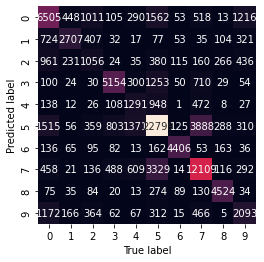

In [ ]:
# Plotting the confusion matrix
mat = confusion_matrix(y_test, y_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('True label')
plt.ylabel('Predicted label');

#### Hyperparameter Tuning (on Model 2)

In [ ]:
# This only ran on parts of the dataset
# Create model creates CNN with variable input for hyperparameter tuning

def create_model(num_filters, kernel_size):
  model = Sequential()
  model.add(layers.Embedding(vocab_size, embedding_dim, 
                           weights=[embedding_matrix], 
                           input_length=maxlen, 
                           trainable=True))           # Trainable = True, to allow embeddings to be trained
  model.add(layers.Conv1D(num_filters, kernel_size, activation='relu'))
  model.add(layers.GlobalMaxPool1D())
  model.add(BatchNormalization())
  model.add(Dropout(0.2)) #reduce overfitting and improve generalization #error 
  model.add(layers.Dense(10, activation='relu'))
  model.add(layers.Dense(10, activation='softmax'))     # 10 nodes & softmax activation function
  model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy', # sparse_categorical_crossentropy as loss-function
              metrics=['accuracy'])
  return model

In [ ]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import RandomizedSearchCV

# Main settings - These settings are not tuned
epochs = 10
embedding_dim = 50
maxlen = 200


# Pad sequences with zeros - Preprocessing step 
X_train = pad_sequences(X_train, padding='post', maxlen=maxlen)
X_valid = pad_sequences(X_valid, padding='post', maxlen=maxlen)
X_test = pad_sequences(X_test, padding='post', maxlen=maxlen)

# Parameter grid for grid search
# Num_filters: Dimensionality of the output space (i.e. the number of output filters in the convolution)
# Kernel_size: Length of the 1D convolution window


param_grid = dict(num_filters=[32, 64, 128],
                      kernel_size=[3, 5, 7])
                    #  vocab_size=[vocab_size],
                    #  embedding_dim=[embedding_dim],
                    #  maxlen=[maxlen])

model = KerasClassifier(build_fn=create_model, epochs=epochs, batch_size=10)

grid = RandomizedSearchCV(estimator=model, param_distributions=param_grid,
                              cv=4, verbose=1, n_iter=5)

grid_result = grid.fit(X_train, y_train)

# Evaluate testing set
test_accuracy = grid.score(X_test, y_test)

Fitting 4 folds for each of 5 candidates, totalling 20 fits
Epoch 1/10
525/525 [==============================] - 4s 6ms/step - loss: 1.7052 - accuracy: 0.3933
Epoch 2/10
525/525 [==============================] - 3s 6ms/step - loss: 1.3069 - accuracy: 0.5366
Epoch 3/10
525/525 [==============================] - 3s 6ms/step - loss: 1.1328 - accuracy: 0.6091
Epoch 4/10
525/525 [==============================] - 3s 6ms/step - loss: 0.9939 - accuracy: 0.6638
Epoch 5/10
525/525 [==============================] - 3s 6ms/step - loss: 0.9081 - accuracy: 0.6870
Epoch 6/10
525/525 [==============================] - 3s 6ms/step - loss: 0.8146 - accuracy: 0.7206
Epoch 7/10
525/525 [==============================] - 3s 6ms/step - loss: 0.7493 - accuracy: 0.7444
Epoch 8/10
525/525 [==============================] - 3s 6ms/step - loss: 0.6799 - accuracy: 0.7735
Epoch 9/10
525/525 [==============================] - 3s 6ms/step - loss: 0.6360 - accuracy: 0.7870
Epoch 10/10
175/175 [===================

In [ ]:
print(" Results from Random Search " )
print("\n The best estimator across ALL searched params:\n", grid.best_estimator_)
print("\n The best score across ALL searched params:\n", grid.best_score_)
print("\n The best parameters across ALL searched params:\n", grid.best_params_)

 Results from Random Search 

 The best estimator across ALL searched params:

 The best score across ALL searched params:
 0.6765714138746262

 The best parameters across ALL searched params:
 {'num_filters': 128, 'kernel_size': 3}


#### Model 2: CNN with pretrained embedding and dropout layer

In [ ]:
# Create embedding matrix

def create_embedding_matrix(filepath, word_index, embedding_dim):
    vocab_size = len(word_index) + 1  # Adding again 1 because of reserved 0 index
    embedding_matrix = np.zeros((vocab_size, embedding_dim))

    with open(filepath) as f:
        for line in f:
            word, *vector = line.split()
            if word in word_index:
                idx = word_index[word] 
                embedding_matrix[idx] = np.array(
                    vector, dtype=np.float32)[:embedding_dim]

    return embedding_matrix

In [ ]:
embedding_dim = 50
embedding_matrix = create_embedding_matrix(
    '/content/drive/My Drive/Natural Language Processing Exam Project/glove.6B.50d.txt',
    tokenizer.word_index, embedding_dim)

In [ ]:
# Calculate percentage of vocab that is covered by the pretrained model

nonzero_elements = np.count_nonzero(np.count_nonzero(embedding_matrix, axis=1))
nonzero_elements / vocab_size

0.41971901908454606

In [ ]:
model = Sequential()
model.add(layers.Embedding(vocab_size, embedding_dim, 
                           weights=[embedding_matrix], 
                           input_length=maxlen, 
                           trainable=True))           # Trainable = True, to allow embeddings to be trained

model.add(layers.Conv1D(128, 3, activation='relu'))
model.add(layers.GlobalMaxPool1D())
model.add(BatchNormalization())
model.add(Dropout(0.2)) #reduce overfitting and improve generalization #error 

model.add(layers.Dense(10, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))     # 10 nodes & softmax activation function
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy', # sparse_categorical_crossentropy as loss-function
              metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 200, 50)           4964750   
                                                                 
 conv1d (Conv1D)             (None, 198, 128)          19328     
                                                                 
 global_max_pooling1d (Globa  (None, 128)              0         
 lMaxPooling1D)                                                  
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 10)                1

In [ ]:
# Clearing the Keras session to avoid starting off with the computed weights from the previous training
clear_session()

In [ ]:
# Fitting the model

%%time
tf.random.set_seed(42)
history = model.fit(X_train, y_train, epochs=10,validation_data=(X_valid, y_valid), batch_size=10)

Epoch 1/10
33213/33213 [==============================] - 1292s 39ms/step - loss: 1.1507 - accuracy: 0.5801 - val_loss: 0.9822 - val_accuracy: 0.6377
Epoch 2/10
33213/33213 [==============================] - 2097s 63ms/step - loss: 1.0192 - accuracy: 0.6257 - val_loss: 0.9528 - val_accuracy: 0.6493
Epoch 3/10
33213/33213 [==============================] - 2094s 63ms/step - loss: 0.9680 - accuracy: 0.6460 - val_loss: 0.9208 - val_accuracy: 0.6605
Epoch 4/10
33213/33213 [==============================] - 2106s 63ms/step - loss: 0.9262 - accuracy: 0.6628 - val_loss: 0.9152 - val_accuracy: 0.6668
Epoch 5/10
33213/33213 [==============================] - 2101s 63ms/step - loss: 0.8883 - accuracy: 0.6782 - val_loss: 0.9013 - val_accuracy: 0.6707
Epoch 6/10
33213/33213 [==============================] - 2090s 63ms/step - loss: 0.8573 - accuracy: 0.6908 - val_loss: 0.9069 - val_accuracy: 0.6742
Epoch 7/10
33213/33213 [==============================] - 2095s 63ms/step - loss: 0.8269 - accuracy:

In [ ]:
print(model.evaluate(X_valid, y_valid))
print(model.evaluate(X_test, y_test))

In [ ]:
# Plotting the training history
plot_training_history(history)

In [ ]:
# Predicting the labels
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)  # Predicted labels were one-hot-encoded, therefore needed to transform back
y_pred

In [ ]:
# Printing the classification report
print(classification_report(y_test, y_pred.round()))

In [ ]:
# Plotting the confusion matrix
mat = confusion_matrix(y_test, y_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('True label')
plt.ylabel('Predicted label');

In [ ]:
model.save("content/drive/My Drive/Natural Language Processing Exam Project/Model/CNN2/CNN4_embeddings_trained_dropout")

In [ ]:
#CNN2 = load_model("content/drive/My Drive/Natural Language Processing Exam Project/Model/CNN2/CNN4_embeddings_trained_dropout")

In [ ]:
print(CNN2.evaluate(X_valid, y_valid))
print(CNN2.evaluate(X_test, y_test))

In [ ]:
# Predicting the labels
y_pred = CNN2.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)  # Predicted labels were one-hot-encoded, therefore needed to transform back
y_pred

In [ ]:
# Printing the classification report
print(classification_report(y_test, y_pred.round()))

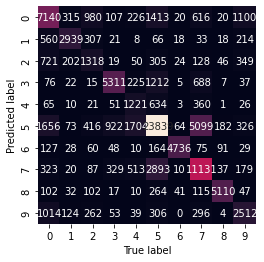

In [ ]:
# Plotting the confusion matrix
mat = confusion_matrix(y_test, y_pred)
sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('True label')
plt.ylabel('Predicted label');

In [ ]:
# Classification report
print('\t\tCLASSIFICATIION METRICS REPORT\n')
print(metrics.classification_report(y_test, y_pred, 
                                    target_names= df['Issue'].unique()))

In [ ]:
#Creating the confusion matrix
confus_matrix = confusion_matrix(y_test, y_pred)
confus_matrix = np.round(confus_matrix / confus_matrix.sum(axis=1, keepdims=True),2)
fig, ax = plt.subplots(figsize=(8,8))
sns.heatmap(confus_matrix, annot=True, cmap="YlGnBu", 
            xticklabels=df["Issue"].values, 
            yticklabels=df["Issue"].values)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title("CONFUSION MATRIX - CNN2\n", size=18)

### Topic Modelling (Unsupervised): LDA and Topic2Vec

#### LDA

Topic modelling using LDA
We will use LDA to split our complaints in 10 different topics. LDA is a unsupervised machine learning model and thus does not need any labels. 
The goal is to see if unsupervised topic modelling enhances our understanding of the issues consumer complaints. And to find similarities between Topics created by the LDA and the Issues within our dataset

The code of Excercise 7 has been used and adapted in order to generate the LDA model

LDA is similar to PCA however it focuses on maximizing the separability amoung categories rather than maximizing the amount of variation.
It consists of two core steps

1) Maximize distance between means of categories
2) Minimize variation within category

In [ ]:
# import the needed libraries
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(42)

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
# first we need to prepare our data for the LDA
# to use our code for lemmatizing and stemming we need to convert the preprocessed complaints back to sentences 
complaint_sents =  convert_to_sentence(X)

100%|██████████| 474366/474366 [00:13<00:00, 34027.32it/s]


In [ ]:
# first we need to prepare our data for the LDA
data_text = pd.DataFrame(data = {"Complaint":complaint_sents}).reset_index() # create a DF with preprocessed complaints in complaint column
data_text['index'] = data_text.index # create an index column

In [ ]:
documents = data_text # store the texts in the documents variable

In [ ]:
#check the length of our documents - should be 474366
len(documents)

474366

In [ ]:
# define a stemmer
stemmer = SnowballStemmer('english')

In [ ]:
#print the shape of documents to see if shape is still correct
print(documents.shape)

(474366, 2)


In [ ]:
# print the first 5 documents
documents[:5]

,index,Complaint
0,0,banking services operating expected suntrust m...
1,1,name complaint made error neither made third p...
2,2,already sent request immediate removal account...
3,3,kia finance showing current open balance open ...
4,4,called experian twice last week today 2022 spo...


In [ ]:
# run the preprocessing for a sample document to see runtime and to check result 
%%time
doc_sample = documents[documents['index'] == 0].values[0][1]
print(doc_sample)
print('\n Original document: ')
words = []
for word in doc_sample.split(' '):
    words.append(word)
print(words)
print('\n tokenized and lemmatized document: ')
print(preprocess(doc_sample))

banking services operating expected suntrust merger truist visible failure referred bbt suntrust brick motor presence truist banking information long standing suntrust bankers long hold times inoperable banking systems assistance year since implementation merger

 Original document: 
['banking', 'services', 'operating', 'expected', 'suntrust', 'merger', 'truist', 'visible', 'failure', 'referred', 'bbt', 'suntrust', 'brick', 'motor', 'presence', 'truist', 'banking', 'information', 'long', 'standing', 'suntrust', 'bankers', 'long', 'hold', 'times', 'inoperable', 'banking', 'systems', 'assistance', 'year', 'since', 'implementation', 'merger']

 tokenized and lemmatized document: 
['bank', 'servic', 'oper', 'expect', 'suntrust', 'merger', 'truist', 'visibl', 'failur', 'refer', 'suntrust', 'brick', 'motor', 'presenc', 'truist', 'bank', 'inform', 'long', 'stand', 'suntrust', 'banker', 'long', 'hold', 'time', 'inoper', 'bank', 'system', 'assist', 'year', 'sinc', 'implement', 'merger']
CPU tim

In [ ]:
# preprocess all documents for the LDA model
%%time
processed_docs = documents['Complaint'].map(preprocess)

CPU times: user 12min 34s, sys: 5.16 s, total: 12min 39s
Wall time: 12min 36s


In [ ]:
# save the preprocessed documents to be able to load them faster for potential next runs
path = '/content/drive/My Drive/NLP_Project/Data/processed_docs_final.csv'

with open(path, 'w', encoding = 'utf-8-sig') as f:
  processed_docs.to_csv(f)

In [ ]:
# show the first 10 preprocessed documents
processed_docs[:10]

0    [bank, servic, oper, expect, suntrust, merger,...
1    [name, complaint, make, error, neither, make, ...
2    [alreadi, send, request, immedi, remov, accoun...
3    [financ, show, current, open, balanc, open, ho...
4    [call, experian, twice, last, week, today, spe...
5    [contact, experian, remov, comment, account, p...
6    [agenc, harass, debt, alreadi, pay, debt, pay,...
7    [place, perman, credit, card, offer, optout, t...
8    [send, letter, regard, inaccur, unknown, thing...
9    [submit, cfpb, complaint, inform, third, parti...
Name: Complaint, dtype: object

In [ ]:
%%time
# create a dictionarry
dictionary = gensim.corpora.Dictionary(processed_docs)

CPU times: user 45 s, sys: 61.3 ms, total: 45 s
Wall time: 44.9 s


In [ ]:
print(len(dictionary.iteritems()))

59576


In [ ]:
# print key and value for the first 11 items in the dictionary
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 assist
1 bank
2 banker
3 brick
4 expect
5 failur
6 hold
7 implement
8 inform
9 inoper
10 long


In [ ]:
# Filter out words that appear in less than 50 documents or in more than 50% of the documents

dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000) # filter extremes
print(len(dictionary.iteritems()))

9103


In [ ]:
%%time
# create a bag of words corpus for the LDA
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

print(bow_corpus[0])
print('length of corpus: ', len(bow_corpus))

[(0, 1), (1, 3), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 2), (11, 2), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 3), (20, 1), (21, 1), (22, 2), (23, 1), (24, 1)]
length of corpus:  474366
CPU times: user 26.8 s, sys: 4.91 s, total: 31.7 s
Wall time: 31.6 s


In [ ]:
# look at the bag-of-word corpus of the frist document

bow_doc_0 = bow_corpus[0]

for i in range(len(bow_doc_0)): # for every tupel in the bag-of-words
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_0[i][0], # print the encoded word
                                                     dictionary[bow_doc_0[i][0]], # print decoded word
                                                     bow_doc_0[i][1])) # print number of times the word appears
    
# everytnhing seemed to work as wanrted. We can see that LDA does not care about semantics or order 

Word 0 ("assist") appears 1 time.
Word 1 ("bank") appears 3 time.
Word 2 ("banker") appears 1 time.
Word 3 ("brick") appears 1 time.
Word 4 ("expect") appears 1 time.
Word 5 ("failur") appears 1 time.
Word 6 ("hold") appears 1 time.
Word 7 ("implement") appears 1 time.
Word 8 ("inform") appears 1 time.
Word 9 ("inoper") appears 1 time.
Word 10 ("long") appears 2 time.
Word 11 ("merger") appears 2 time.
Word 12 ("motor") appears 1 time.
Word 13 ("oper") appears 1 time.
Word 14 ("presenc") appears 1 time.
Word 15 ("refer") appears 1 time.
Word 16 ("servic") appears 1 time.
Word 17 ("sinc") appears 1 time.
Word 18 ("stand") appears 1 time.
Word 19 ("suntrust") appears 3 time.
Word 20 ("system") appears 1 time.
Word 21 ("time") appears 1 time.
Word 22 ("truist") appears 2 time.
Word 23 ("visibl") appears 1 time.
Word 24 ("year") appears 1 time.


In [ ]:
from gensim import corpora, models
#Compute TF-IDF by multiplying term frequency with inverse document frequency and normalizing the resulting docs to unit length
tfidf = models.TfidfModel(bow_corpus)

In [ ]:
# apply tidf model to the corpus
corpus_tfidf = tfidf[bow_corpus]

In [ ]:
# print the first document of the transformed corpus

print(corpus_tfidf[0])


[(0, 0.09320702938281136), (1, 0.17170471069682414), (2, 0.15948415748774933), (3, 0.23103861543470885), (4, 0.1149001318893649), (5, 0.09799388171758024), (6, 0.08205916796267107), (7, 0.1738570129894592), (8, 0.025576277185786263), (9, 0.26956645412555635), (10, 0.20838193846361686), (11, 0.36361183306347694), (12, 0.17262214870553047), (13, 0.1281614586117976), (14, 0.1703529657969129), (15, 0.08970343951747665), (16, 0.054712997433481944), (17, 0.05578015594759911), (18, 0.10613007962019352), (19, 0.5102451565956677), (20, 0.08171751644050686), (21, 0.03339358892699172), (22, 0.40291859175795136), (23, 0.20094235291675733), (24, 0.05263948766614743)]


In [ ]:
%%time
# create a LDA model with 10 topics
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, 
                                       id2word=dictionary, passes=2, 
                                       workers=16)

CPU times: user 37.3 s, sys: 15.1 s, total: 52.4 s
Wall time: 44.1 s


In [ ]:
# print the words occurring in each topic
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.048*"payment" + 0.028*"inquiri" + 0.018*"bank" + 0.017*"make" + 0.015*"late" + 0.011*"would" + 0.010*"call" + 0.010*"month" + 0.009*"receiv" + 0.009*"loan"
Topic: 1 
Words: 0.046*"consum" + 0.033*"inform" + 0.016*"agenc" + 0.013*"section" + 0.012*"disput" + 0.011*"creditor" + 0.009*"violat" + 0.009*"day" + 0.009*"delet" + 0.008*"furnish"
Topic: 2 
Words: 0.028*"date" + 0.023*"balanc" + 0.022*"inform" + 0.018*"payment" + 0.017*"remov" + 0.014*"disput" + 0.012*"late" + 0.012*"inaccur" + 0.010*"open" + 0.010*"updat"
Topic: 3 
Words: 0.038*"call" + 0.017*"tell" + 0.013*"say" + 0.013*"would" + 0.012*"receiv" + 0.011*"inform" + 0.011*"time" + 0.011*"compani" + 0.011*"phone" + 0.010*"back"
Topic: 4 
Words: 0.022*"equifax" + 0.012*"number" + 0.012*"bank" + 0.010*"disput" + 0.009*"inform" + 0.009*"file" + 0.008*"state" + 0.008*"remov" + 0.008*"address" + 0.008*"capit"
Topic: 5 
Words: 0.041*"inform" + 0.023*"ident" + 0.021*"theft" + 0.019*"file" + 0.018*"remov" + 0.016*"fraud

Based on the words within each topic we can do a first analysis of the 10 topics. We will first try to find a short topic description that is coherent with the words within each topic and then will look for issue labels

{0: 'Managing an account',

 1: 'Incorrect information on your report',

 2: 'Attempts to collect debt not owed',
 
 3: "Problem with a credit reporting company's investigation into an existing problem",

 4: 'Written notification about debt',
 
 5: 'Improper use of your report',
 
 6: 'Trouble during payment process',
 
 7: 'False statements or representation'
 
 8: 'Communication tactics',
 
 9: 'Incorrect information on credit report'}
 
 that seem to be similar to the topic.  


Topic 0: Inquiries about late payments and loans
--> similar to label 1,5,6

Topic 1: Broad topic - hard to find coherent description

Topic 2: Inform and dispute about inaccurate balance asking for updating or removal
--> similar to label 1,3

Topic 3: Communication issues
--> similar to label 8

Topic 4: Complaints about Equifax
--> broad topic

Topic 5: Identity theft, fraud 
--> similar to label 0,1


Topic 6: Questions regarding loan and payment dates
--> similar to label 1,9

Topic 7: Mortgage, payments, loans and checks
--> similar to label 6

Topic 8: Validity of debt collection
--> similar to label 2,7

Topic 9: Proof of debt origin
--> similar to label 3


In [ ]:
from gensim.test.utils import datapath
# saving model in drive
file_path = datapath("/content/drive/MyDrive/NLP_Project/Models/LDA_final/lda_model_final")
lda_model.save(file_path)

In [ ]:
# install pyLDAvis to plot the results
!pip install pyLDAvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 5.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-py2.py3-none-any.whl size=136898 sha256=791c014c325c904313b47d0ea0f1f05ab78430e18b9f740b41ac961854a7d16a
  Stored in directory: /root/.cache/pip/wheels/c9/21/f6/17bcf2667e8a68532ba2fbf6d5c72fdf4c7f7d9abfa4852d2f
Successfully built pyLDAvis


In [ ]:
%matplotlib inline
import pyLDAvis
import pyLDAvis.gensim_models
import gensim

# visualize the results 

vis = pyLDAvis.gensim_models.prepare(lda_model, bow_corpus, dictionary)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Iterable


Looking at the visualization we can see that a cluster of Topics 1,4,5 and 6.
This is partly coherent with our descriptions of the topics we had earlier (Note topics have been renamed by pyLDAvis and 1 = Topic 3 4=Topic 6, 5=Topic 7, 6 = Topic 0 - especially Topic 6,7,0 are similar also description wise) but still results in new insights.
The cluster is also suggesting that several complaints are close together and might justify a skewed distribution of Issues such as the one we have seen in our Exploratory data analysis.
 We will look at the coherence score of the model and the distribution of the clusters created by the LDA within the labeld Issues in the following.

In [ ]:
# Load the LDA_model without the need to rerun all the previous steps 
from gensim import  models
from gensim.test.utils import datapath
file_path = datapath("/content/drive/MyDrive/NLP_Project/Models/LDA_final/lda_model_final")
lda_model_final = models.ldamodel.LdaModel.load(file_path)

/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.7/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)


In [ ]:
from gensim.models.coherencemodel import CoherenceModel

In [ ]:
# Compute Coherence Score
%%time
coherence_model_lda = CoherenceModel(model=lda_model, texts=processed_docs, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.4628468579044471
CPU times: user 28.5 s, sys: 31.1 s, total: 59.5 s
Wall time: 50 s


The Coherence score of our model is 0.46
The coherence score is a tool to measure how interpretable topics are to humans. We will compare this score to the Top2Vec coherence score later.

In [ ]:
# to get the distribution of the topics within the Issues we first need the Issues
issue_list = df.Issue.to_list()

In [ ]:
# Get dominant topic 
def format_topics_sentences(ldamodel=lda_model, corpus=bow_corpus, texts=processed_docs,topic_list=issue_list):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    # Add the Issue of each complaint to the dataframe
    sent_topics_df["Issue"] = issue_list
    return(sent_topics_df)

In [ ]:
%%time

df_topic_sents_keywords = format_topics_sentences()

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text','Issue']


CPU times: user 1h 23min 32s, sys: 1min 28s, total: 1h 25min 1s
Wall time: 1h 24min 23s


In [ ]:
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Issue
0,0,4.0,0.9169,"equifax, number, bank, disput, inform, file, s...","[bank, servic, oper, expect, suntrust, merger,...",Managing an account
1,1,4.0,0.6450,"equifax, number, bank, disput, inform, file, s...","[name, complaint, make, error, neither, make, ...",Incorrect information on your report
2,2,5.0,0.7352,"inform, ident, theft, file, remov, fraudul, di...","[alreadi, send, request, immedi, remov, accoun...",Incorrect information on your report
3,3,2.0,0.6430,"date, balanc, inform, payment, remov, disput, ...","[financ, show, current, open, balanc, open, ho...",Incorrect information on your report
4,4,3.0,0.6415,"call, tell, say, would, receiv, inform, time, ...","[call, experian, twice, last, week, today, spe...",Incorrect information on your report
5,5,2.0,0.7485,"date, balanc, inform, payment, remov, disput, ...","[contact, experian, remov, comment, account, p...",Incorrect information on your report
6,6,6.0,0.6753,"loan, payment, time, make, year, pay, compani,...","[agenc, harass, debt, alreadi, pay, debt, pay,...",Attempts to collect debt not owed
7,7,0.0,0.5698,"payment, inquiri, bank, make, late, would, cal...","[place, perman, credit, card, offer, optout, t...",Incorrect information on your report
8,8,1.0,0.9816,"consum, inform, agenc, section, disput, credit...","[send, letter, regard, inaccur, unknown, thing...",Problem with a credit reporting company's inve...
9,9,5.0,0.9719,"inform, ident, theft, file, remov, fraudul, di...","[submit, cfpb, complaint, inform, third, parti...",Incorrect information on your report


In [ ]:
from google.colab import files

df_dominant_topic.to_csv('output.csv', encoding = 'utf-8-sig') 
files.download('output.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

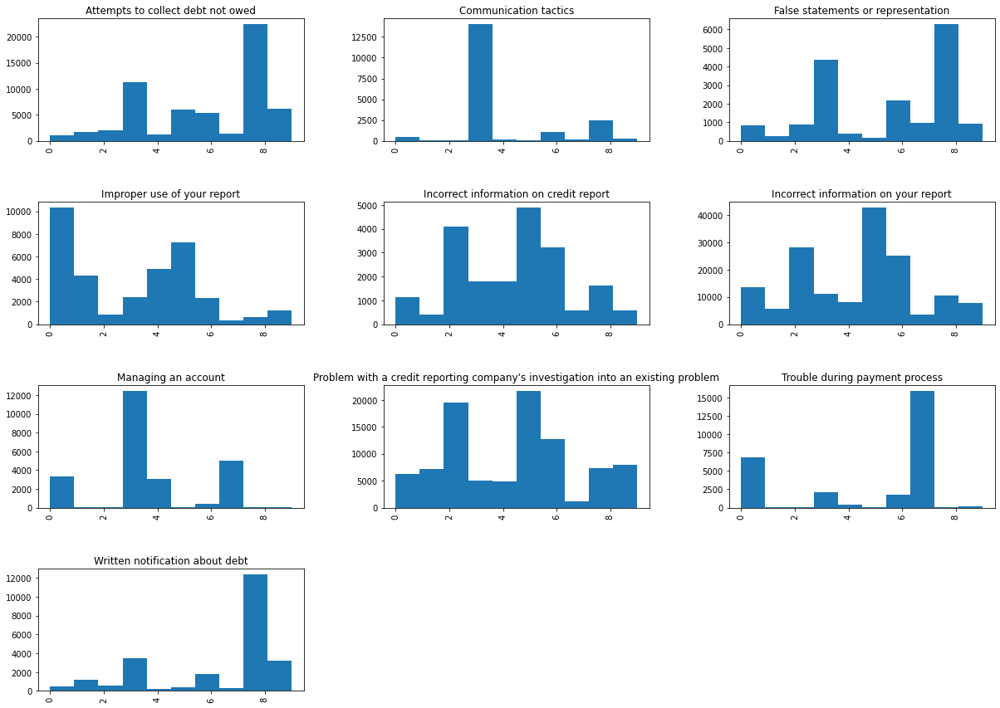

In [ ]:
plot_lda_topics = df_dominant_topic["Dominant_Topic"].hist(by=df_dominant_topic["Issue"],figsize=(20,15))

Looking at the visualizations we see several clear patterns especially with in the "Communication Tactics","Managing an account", "Trouble during payment process" and "Written notification about debt" Issues. 

"Communication Tactics" complaints are mainly in Topic cluster 3
"Managing an account" complaints are mainly in Topic cluster 3
"Trouble during payment process" complaints are mainly in Topic cluster 7
And "Written notification about debt" complaints are mainly in Topic cluster 8

This visualization shows similarities within Issues and that complaints within some Issues have the same features. E.g."Communication Tactics","Managing an account" include Communication (Topic cluster 3) and the destinction between the two Issues seems to have some ambiguity.

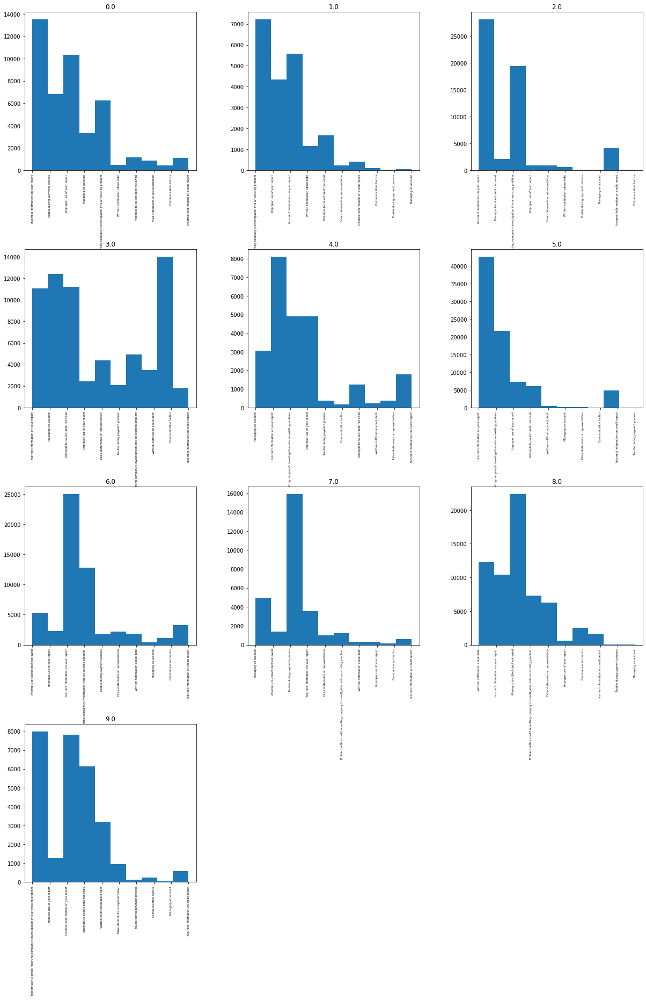

In [ ]:
plot_lda_topics_reverse = df_dominant_topic["Issue"].hist(by=df_dominant_topic["Dominant_Topic"],figsize=(20,30), xlabelsize=5)



The plot of the distribution of the Issues within each Topic cluster shows that e.g. the Issue "Trouble during payment process" is quite well represented by topic 7. However this graph is harder to interpret and we will focus on our previous results. 
Note: X-Labels are not the same for each graph 

#### Top2Vec

In [ ]:
!pip install top2vec # If gensim was installed in same session kernel first has to be restarted in order to correctly import this

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 3.2 MB/s 
     |████████████████████████████████| 24.1 MB 1.1 MB/s 
     |████████████████████████████████| 5.2 MB 76.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.1 MB 66.7 MB/s 
  Created wheel for hdbscan: filename=hdbscan-0.8.28-cp37-cp37m-linux_x86_64.whl size=2342153 sha256=70c42d7a49057feb819b94ef15c71aeb14f2845338fd812d98cdc401b36040f6
  Stored in directory: /root/.cache/pip/wheels/6e/7a/5e/259ccc841c085fc41b99ef4a71e896b62f5161f2bc8a14c97a
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=58033c67635828b2fafe80419d102eccae793c9b55bdbc646a136c6995d35391
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Creat

In [ ]:
from top2vec import Top2Vec

In [ ]:
# Create a list of strings of the complaints as input
complaint_sents =  convert_to_sentence(X)

100%|██████████| 474366/474366 [00:05<00:00, 79313.99it/s]


##### Top2Vec_full

In [ ]:
# First we will run Top2Vec without any restrictions on how to cluster the complaints
%%time
umap_args = {"random_state":42}
top2vec_model_full = Top2Vec(documents = complaint_sents, min_count =50, speed="learn",workers=16,verbose=True, umap_args = umap_args)

2022-05-28 03:21:39,433 - top2vec - INFO - Pre-processing documents for training
2022-05-28 03:23:51,542 - top2vec - INFO - Creating joint document/word embedding
2022-05-28 04:31:53,618 - top2vec - INFO - Creating lower dimension embedding of documents
2022-05-28 04:46:39,999 - top2vec - INFO - Finding dense areas of documents
2022-05-28 04:46:56,254 - top2vec - INFO - Finding topics


CPU times: user 11h 19min 3s, sys: 51min 58s, total: 12h 11min 2s
Wall time: 1h 25min 27s


In [ ]:
top2vec_model_full.save("/content/drive/MyDrive/NLP_Project/Models/Top2Vec_full/top2vec_model_full")

In [ ]:
# We can see that we get 2283 topics
top2vec_model_full.get_num_topics()

2283

In [ ]:
# We will look at the topic sizes to see of how many complaints the top 10 and smallest 10 clusters consist of
topic_sizes, topic_nums = top2vec_model_full.get_topic_sizes()
print(topic_sizes[:10])
print(topic_sizes[-10:])

[3925 3634 3584 2711 2633 2560 2489 2454 2279 1947]
[21 21 21 21 19 19 19 17 17 16]


The sizes of the clusters are very small and it would not be economically feasable for further analysis of complaints to divide the complaints into that small topics (especially when we consider that we are only working on a subset with the top 10 Issues and would have even more small topics when looking at the whole dataset)  

In [ ]:
topic_words, word_scores, topic_nums = top2vec_model_full.get_topics()
df_top2vec = pd.DataFrame({"Topic":topic_nums.tolist(),"topic_words":topic_words.tolist(),"word_scores":word_scores.tolist()})

In [ ]:
df_top2vec

,Topic,topic_words,word_scores
0,0,"[score, points, scores, decrease, lowering, de...","[0.5925456881523132, 0.5729115009307861, 0.506..."
1,1,"[hospital, doctor, copay, doctors, physicians,...","[0.7206370830535889, 0.6768694519996643, 0.644..."
2,2,"[calling, caller, harassing, hang, spoofed, ce...","[0.5727256536483765, 0.5499836802482605, 0.515..."
3,3,"[escrow, taxes, shortage, analysis, projected,...","[0.6865334510803223, 0.6604764461517334, 0.645..."
4,4,"[apartment, apartments, rented, vacating, move...","[0.7231127619743347, 0.6854557394981384, 0.658..."
...,...,...,...
2278,2278,"[cares, covid, coronavirus, deferred, forbeara...","[0.540573000907898, 0.43598616123199463, 0.410..."
2279,2279,"[obligated, unwilling, adequate, considering, ...","[0.34299179911613464, 0.2565763294696808, 0.24..."
2280,2280,"[complying, wished, lexisnexis, pendency, seq,...","[0.3976793587207794, 0.28978604078292847, 0.24..."
2281,2281,"[affiliates, sir, madam, medicare, dear, subsi...","[0.4371049106121063, 0.31426361203193665, 0.30..."


We will now look at the first 10 topics and the wordclouds of the words with the highest semantic similarity to topic.

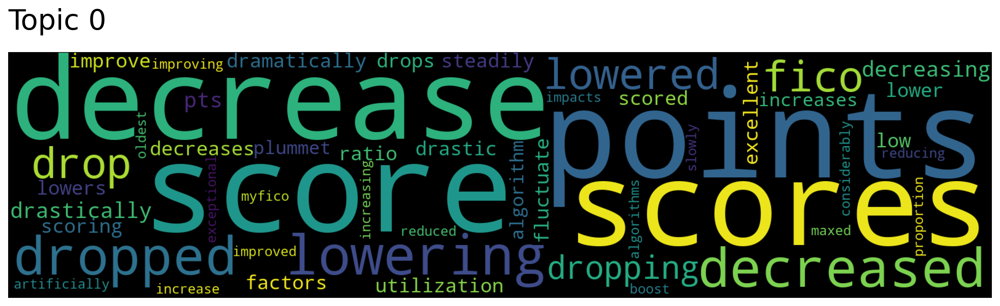

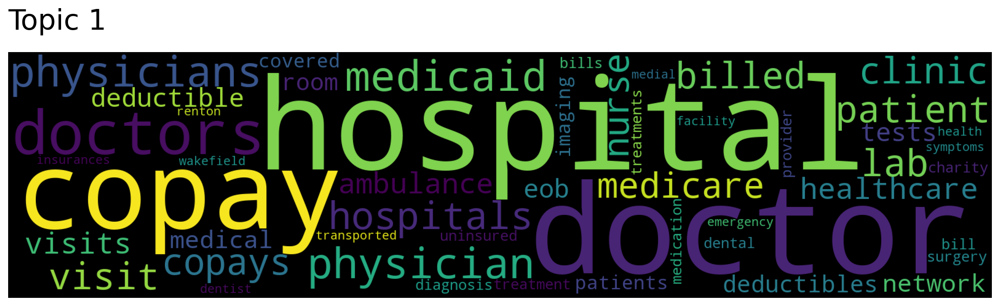

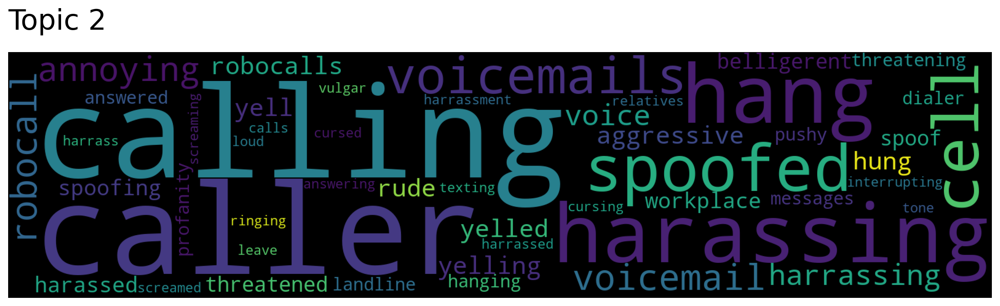

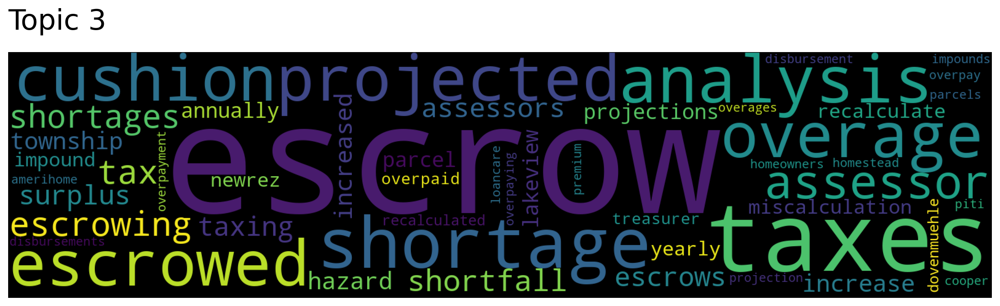

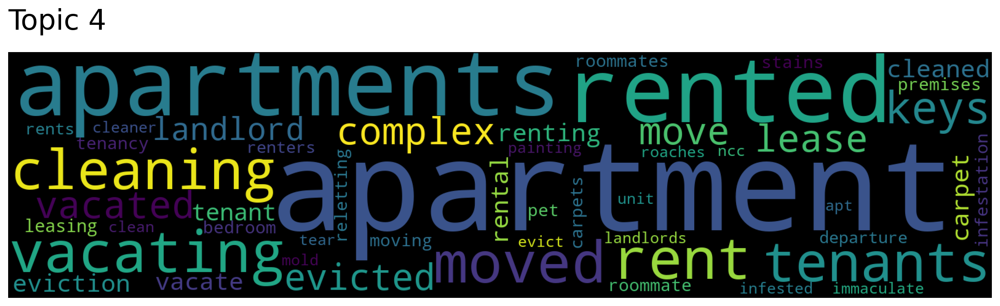

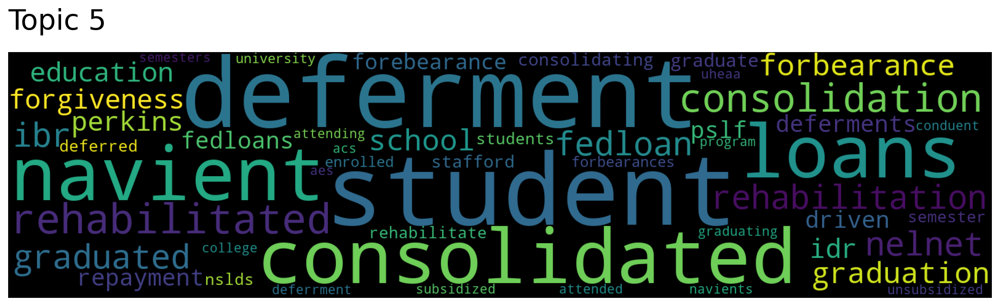

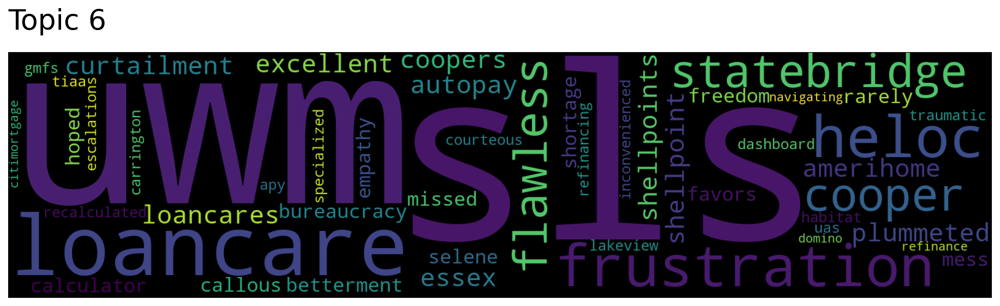

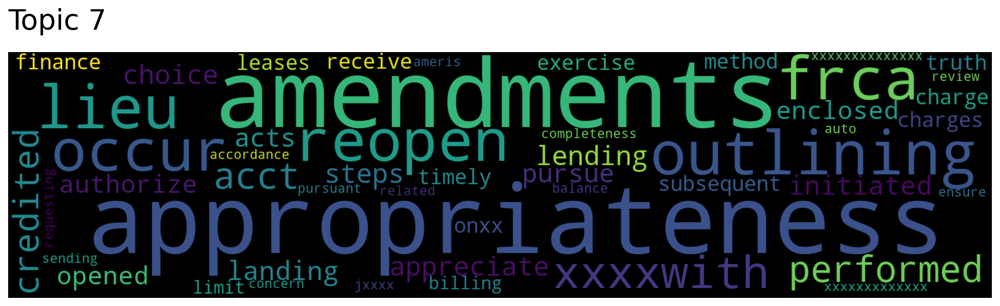

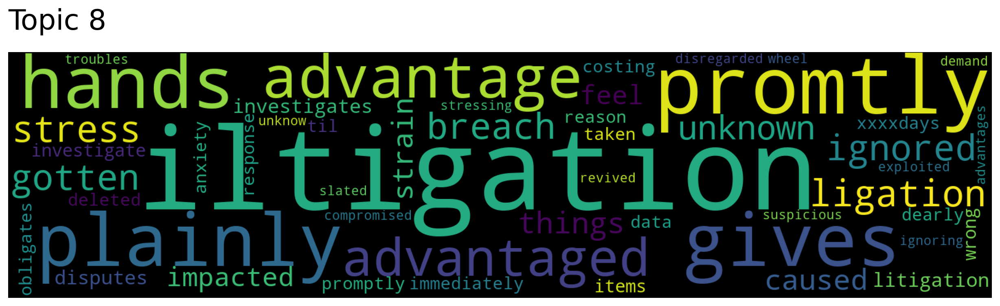

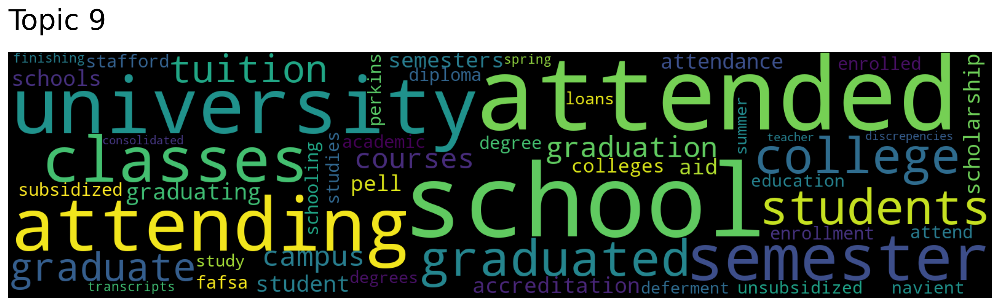

In [ ]:
for topic in topic_nums[:10]:
    top2vec_model_full.generate_topic_wordcloud(topic)

The topics generated are very granular and could be used to analyse the analyse the complaints of specific groups or differnt type of bills or specific problem(e.g. 
Topic 0: Credit/ Fico score decrease

Topic 1: Hospital and doctor bills

Topic 2: Spoofing and unwanted calls

Topic 3: Escrow accounts

Topic 4: Rent and appartments

Topic 5: Student loans (deferment)

Topic 6: Mortages

Topic 7: broad topic (appropriateness of smaller issues)

Topic 8: iltigations etc

Topic 9: complaints from or around university students

Such a granular treatment can lead to very narrow classification especially as the remaining 2272 topics are very small however it might be to granular so we will try to reduce the amount of topics

##### Top2Vec_5000

We will adapt the hdbscan parameters to reduce the amount of clusters. We will first try this with a minimum cluster size of 5000

In [ ]:
%%time
hdbscan_args = {"min_cluster_size":5000,"min_samples":100}
umap_args = {"random_state":42}
top2vec_model_5000 = Top2Vec(documents = complaint_sents, min_count =50, speed="learn",workers=16,verbose=True,hdbscan_args=hdbscan_args, umap_args = umap_args)

2022-05-28 01:59:49,284 - top2vec - INFO - Pre-processing documents for training
2022-05-28 02:01:55,691 - top2vec - INFO - Creating joint document/word embedding
2022-05-28 03:05:16,781 - top2vec - INFO - Creating lower dimension embedding of documents
2022-05-28 03:20:51,343 - top2vec - INFO - Finding dense areas of documents
2022-05-28 03:21:10,723 - top2vec - INFO - Finding topics


CPU times: user 12h 8min 7s, sys: 45min 49s, total: 12h 53min 56s
Wall time: 1h 21min 22s


In [ ]:
top2vec_model_5000.save("/content/drive/MyDrive/NLP_Project/Models/Top2Vec_5000/top2vec_model_5000")

In [ ]:
top2vec_model_5000 = Top2Vec.load("/content/drive/MyDrive/NLP_Project/Models/Top2Vec_5000/top2vec_model_5000")

In [ ]:
top2vec_model_5000.get_num_topics()

2

Only 2 clusters are found with the parameters and we will reduce consequently reduce the min_cluster_size after a short analysis of the two clusters

In [ ]:
topic_sizes, topic_nums = top2vec_model_5000.get_topic_sizes()
print(topic_sizes[:10])
print(topic_sizes[-10:])

[404402  69964]
[404402  69964]


In [ ]:
topic_words, word_scores, topic_nums = top2vec_model_5000.get_topics()
df_top2vec_5000 = pd.DataFrame({"Topic":topic_nums.tolist(),"topic_words":topic_words.tolist(),"word_scores":word_scores.tolist()})

In [ ]:
df_top2vec_5000

,Topic,topic_words,word_scores
0,0,"[prequalified, lived, oportun, popping, wallet...","[0.15183518826961517, 0.14772756397724152, 0.1..."
1,1,"[bureauthe, complied, xxxxxxxxbalance, modes, ...","[0.6095430254936218, 0.5826422572135925, 0.551..."


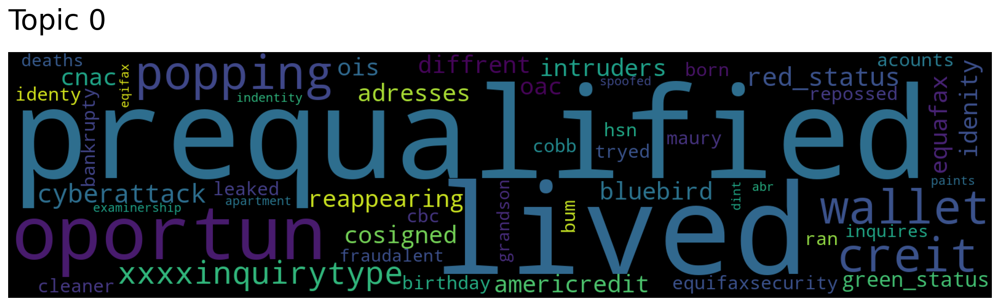

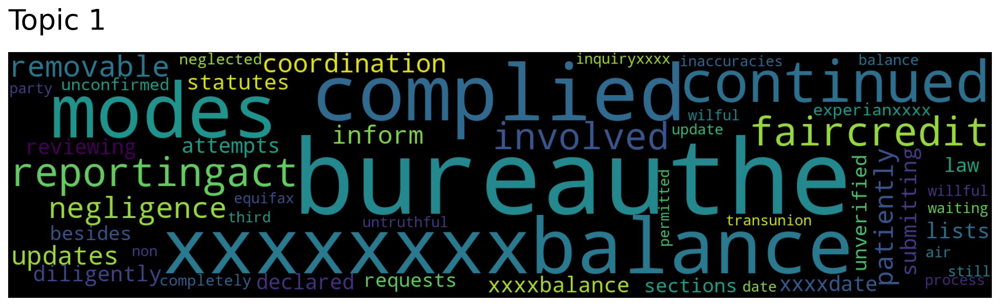

In [ ]:
for topic in topic_nums:
    top2vec_model_5000.generate_topic_wordcloud(topic)

The Wordclouds do not show very coherent topics and we will move on to the next model

##### Top2Vec_1000

We will reduce the min_cluster_size to 1000 complaints per cluster to see the corresponding topics

In [ ]:
%%time
hdbscan_args = {"min_cluster_size":1000,"min_samples":100}
umap_args = {"random_state":42}
top2vec_model_1000 = Top2Vec(documents = complaint_sents, min_count =50, speed="learn",workers=16,verbose=True,hdbscan_args=hdbscan_args, umap_args = umap_args)

2022-05-28 06:52:27,034 - top2vec - INFO - Pre-processing documents for training
2022-05-28 06:54:26,899 - top2vec - INFO - Creating joint document/word embedding
2022-05-28 08:09:40,684 - top2vec - INFO - Creating lower dimension embedding of documents
2022-05-28 08:25:35,558 - top2vec - INFO - Finding dense areas of documents
2022-05-28 08:25:53,683 - top2vec - INFO - Finding topics


CPU times: user 11h 1min 11s, sys: 54min 45s, total: 11h 55min 57s
Wall time: 1h 33min 34s


In [ ]:
top2vec_model_1000.save("/content/drive/MyDrive/NLP_Project/Models/Top2Vec_1000/top2vec_model_1000")

In [ ]:
top2vec_model_1000.get_num_topics()

93

We get 93 topics. This is a number we can work with!

In [ ]:
topic_sizes, topic_nums = top2vec_model_1000.get_topic_sizes()
print(topic_sizes[:10])
print(topic_sizes[-10:])

[22782 21241 20596 11489 11465 11138 10923 10655  9760  8952]
[1890 1873 1723 1710 1548 1547 1531 1455 1271  983]


In [ ]:
topic_words, word_scores, topic_nums = top2vec_model_1000.get_topics()
df_top2vec_1000 = pd.DataFrame({"Topic":topic_nums.tolist(),"topic_words":topic_words.tolist(),"word_scores":word_scores.tolist()})

In [ ]:
df_top2vec_1000

,Topic,topic_words,word_scores
0,0,"[calling, caller, harassing, hang, yelling, sp...","[0.5517393350601196, 0.550836443901062, 0.5128..."
1,1,"[atm, overdrawn, debit, deposited, branch, atm...","[0.5351132750511169, 0.5163652300834656, 0.462..."
2,2,"[stuff, sick, crazy, gon, guys, wan, messing, ...","[0.32503625750541687, 0.27842947840690613, 0.2..."
3,3,"[certified, validating, responding, libellant,...","[0.3627364933490753, 0.3353967070579529, 0.333..."
4,4,"[civilly, usc, federally, affiant, infringed, ...","[0.47760850191116333, 0.4660727083683014, 0.41..."
...,...,...,...
88,88,"[amendments, appropriateness, outlining, acct,...","[0.7101356983184814, 0.7051617503166199, 0.666..."
89,89,"[hunter, warfield, apartment, apartments, rent...","[0.5488130450248718, 0.542479395866394, 0.3882..."
90,90,"[salesmen, newer, theftc, inquirie, ran, compr...","[0.3644202947616577, 0.31907209753990173, 0.30..."
91,91,"[usage, unwilling, photo, initiate, postal, co...","[0.5142033696174622, 0.5029802322387695, 0.490..."


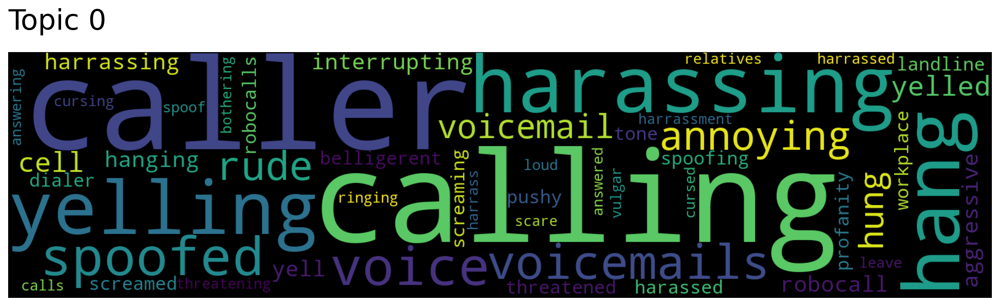

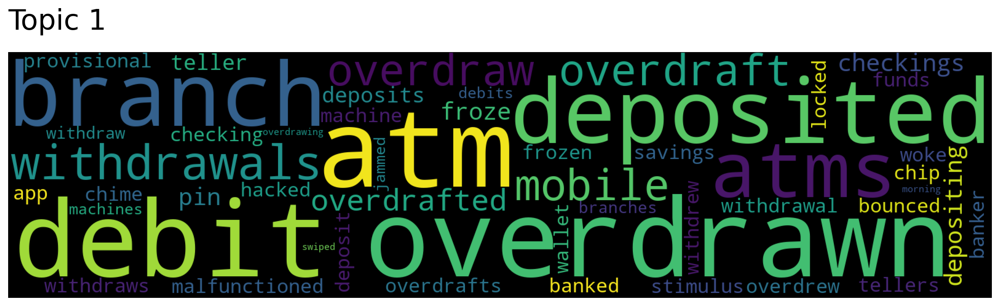

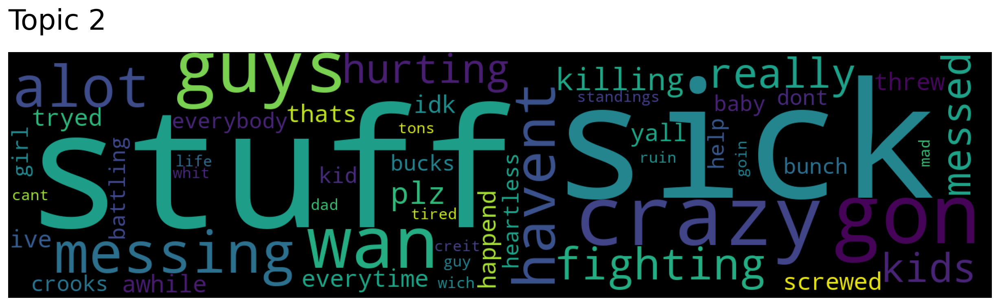

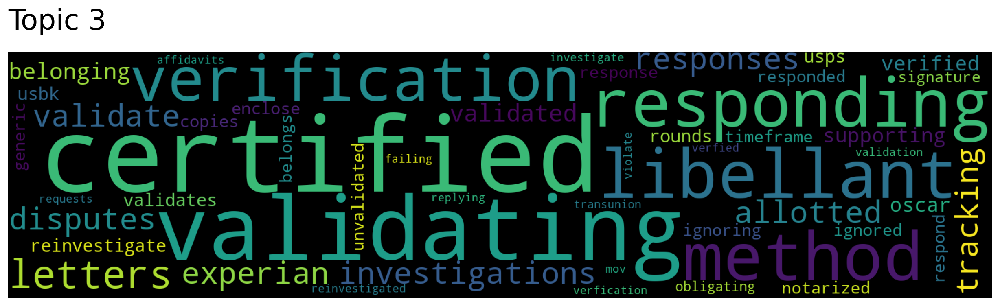

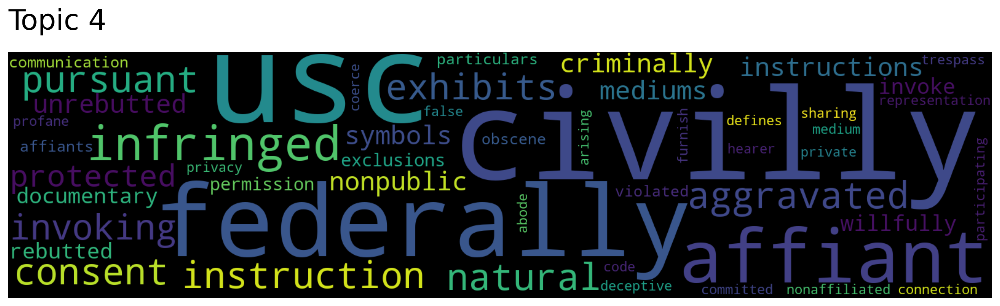

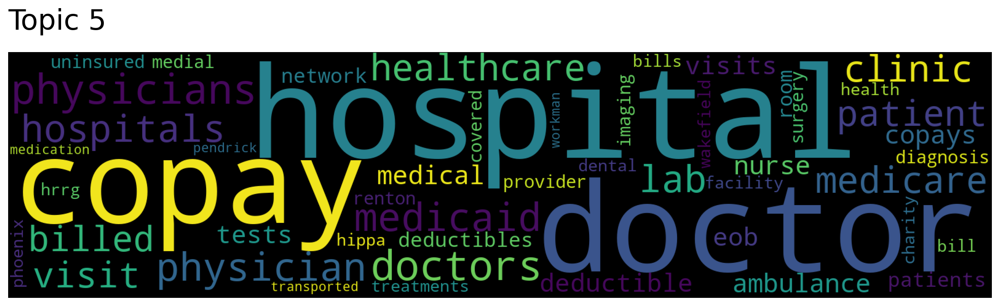

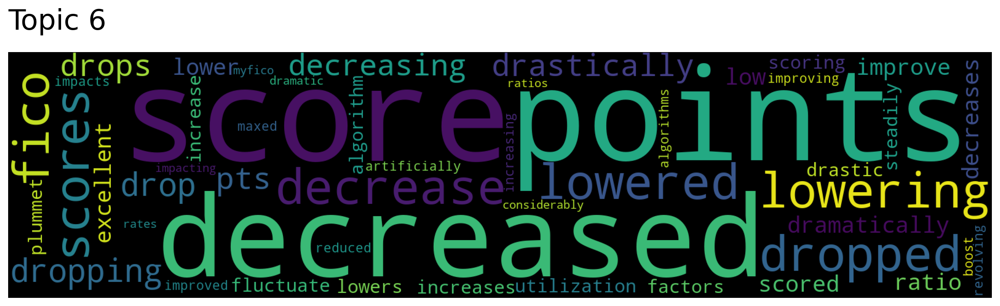

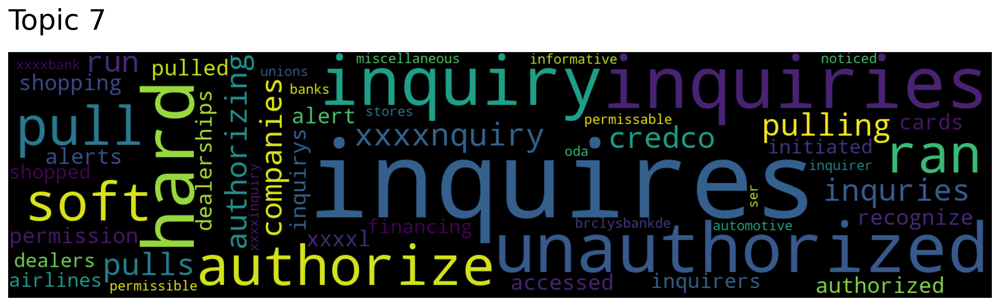

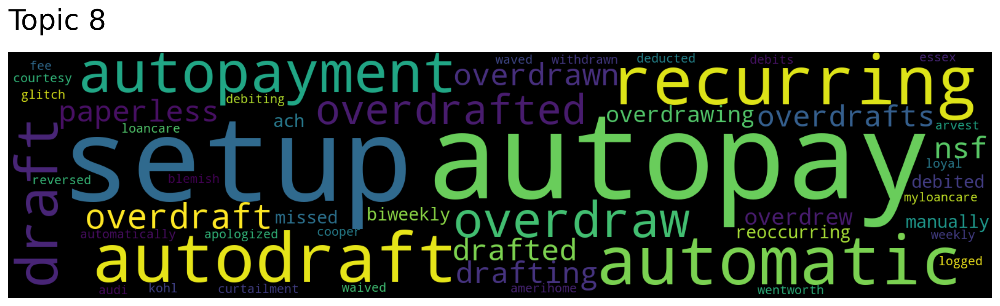

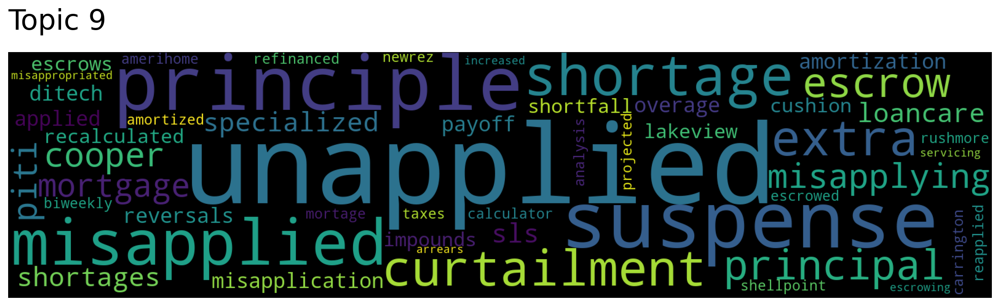

In [ ]:
for topic in topic_nums[:10]:
    top2vec_model_1000.generate_topic_wordcloud(topic)

The topics generated are broader than of the ones of the unrestricted Top2Vec model but still very coherent. Tuning the hyperparameters of hdbscan can help a lot to increase the value of the top2vec model.

Top10 topics:

Topic 0: Spoofing and unwanted calls

Topic 1: Atm withdrawels and overdrawns

Topic 2: Angy consumers

Topic 3: Verification and certifications

Topic 4: civilly and federally claims

Topic 5: Hopital and doctor bills

Topic 6: Credit and Frico score decreases

Topic 7: Inquiries and authorization

Topic 8: Autopay, autodraft, automatic payments

Topic 9: broad topic

We can see that the top 10 topics of the unadjusted and ajusted top2vec are very similar and that reducing the number of clusters seems to have the wanted effect of being able to get clusters that are big enough to economically justify the different treatment of the clusters. 

######All 93 topics

In [1]:
for topic in topic_nums:
    top2vec_model_1000.generate_topic_wordcloud(topic)